# News recommender system

The purpose of this notebook is to create a content-based recommendation algorithm for BBC News, finding similar articles to custom input text.

In [1]:
# Load dependencies

import pandas as pd
import numpy as np
import json, os, re
from collections import defaultdict, Counter

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
color_1 = cm.get_cmap("Set2")(2) # set blue 
color_2 = cm.get_cmap("Set2")(1) # set orange

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
%run src/tools.py
%run recommender.py

## 1. Data loading

In [2]:
# Path to dataset

DATA_PATH = os.path.join('data', 'bbc_news.json')
print('Data path: {}'.format(DATA_PATH))

Data path: data/bbc_news.json


In [3]:
# Load the data

with open(DATA_PATH,'r') as f:
    content = f.read()
    f.close()
    
data = json.loads(content)
print('There are {} samples in the data set.'.format(len(data)))

There are 2225 samples in the data set.


The data is structured as a list of dictionaries. Below, I will load the data in a DataFrame.

In [4]:
# Load data in DataFrame

df = pd.concat((pd.Series(data[i].values()) for i in range(len(data))), axis = 1).T

# Add column names
df.columns = list(data[0].keys())

# Drop duplicated entries
df.drop_duplicates(inplace=True)
# Reset index
df.reset_index(inplace=True,drop=True)
# Strip leading and training space from the "text" column
df['text'] = df['text'].apply(lambda x: x.strip())

print('Data shape: ',df.shape)

Data shape:  (2225, 4)


In [5]:
# Show a few rows from the data

with pd.option_context('display.max_colwidth', None):
    display(df.sample(3))

,id,category,title,text
1026,1027,politics,Peace demo appeal rejected,"Peace protestors have lost a landmark appeal over police actions in stopping an anti-war demonstration days after the start of the Iraq war. They had appealed against a High Court decision that it was not unlawful for police to forcibly turn protestors away near RAF Fairford, Glos, in 2003. The police had also sought to overturn a breach of human rights ruling arising from the same case. Sitting on Wednesday, three Appeal Court judges dismissed both appeals. They were challenging decisions by two judges in the High Court in February this year. It followed action by police, when three coachloads of people were searched and detained on the way to RAF Fairford and forced to return to London under police escort. The demonstrators appealed against a finding by Lord Justice May and Mr Justice Harrison that it was not unlawful for the police to turn the passengers away. The police were urging Lord Chief Justice and Lord Justices Clarke and Rix to overturn the ruling that they had breached the protestors' human rights by detaining them in the coaches. Craig Mackey, assistant chief constable of Gloucestershire Police, said: ""We have always considered that our responses were proportionate and all our decisions on the day were based on intelligence."" He said no one on the coaches accepted responsibility for items found on the coaches including body armour, a smoke bomb and five shields. ""Given these circumstances, and the fact that RAF Fairford, and other military installations in the UK, had been the scene of increasingly destructive disorder in the weeks preceding this incident, the police commander on the ground made the decision to turn back the coaches. ""From day one we have vigorously defended this decision, which was made out of a genuine concern that if the coaches were allowed to proceed it would have resulted in disorder and criminal damage at RAF Fairford."" Fairford Coach Action, representing more than 80 people who appealed against the police actions, say they are prepared to take their case to the European Court of Human Rights. Their action is supported by Amnesty International and Liberty."
808,809,entertainment,Fry set for role in Hitchhiker's,"Actor Stephen Fry is joining the cast of the forthcoming film adaptation of The Hitchhiker's Guide To The Galaxy. Fry will provide the voice of The Guide, an electronic book which accompanies the story's hero Arthur Dent on his travels around the galaxy. Martin Freeman, John Malkovich, Bill Nighy and Alan Rickman are co-starring in the film, due for release in May. The late Douglas Adams' original 1977 scripts have also been turned into a series of successful books. ""Being asked to do the voice of The Guide is like having your birthday on Christmas Day, discovering a winning lottery ticket in your stocking and having chocolate poured all over you,"" said Fry, a self-confessed fan of the book. The film's executive producer Robbie Stamp said that Adams, who died in 2001, would have been ""delighted"" with the choice of Fry for the role. ""His humour and intelligence are perfect for the voice of The Guide,"" added Mr Stamp. Adams wrote the screenplay based on his book before his premature death, while a new radio series was aired 26 years after the first broadcast and included many of the original cast members. Hollywood star Malkovich will play religious cult leader Humma Kavula, which was especially created by Adams for the new film. Freeman, who starred in hit BBC comedy The Office, will play the role of Arthur Dent, who begins his intergalactic voyage following the destruction of the Earth."
1505,1506,sport,Real in talks over Gravesen move,"Real Madrid are closing in on a £2m deal for Everton's Thomas Gravesen after the Dane's agent travelled to Spain to hold talks about a move. John Sivabaek told BBC Sport: ""I'm here to listen to what Real have to say. Nothing has been agreed, but this is a big opportun

## 2. Exploratory Data Analysis

### How many samples per category do we have?

In [6]:
df['category'].value_counts()

sport            511
business         510
politics         417
tech             401
entertainment    386
Name: category, dtype: int64

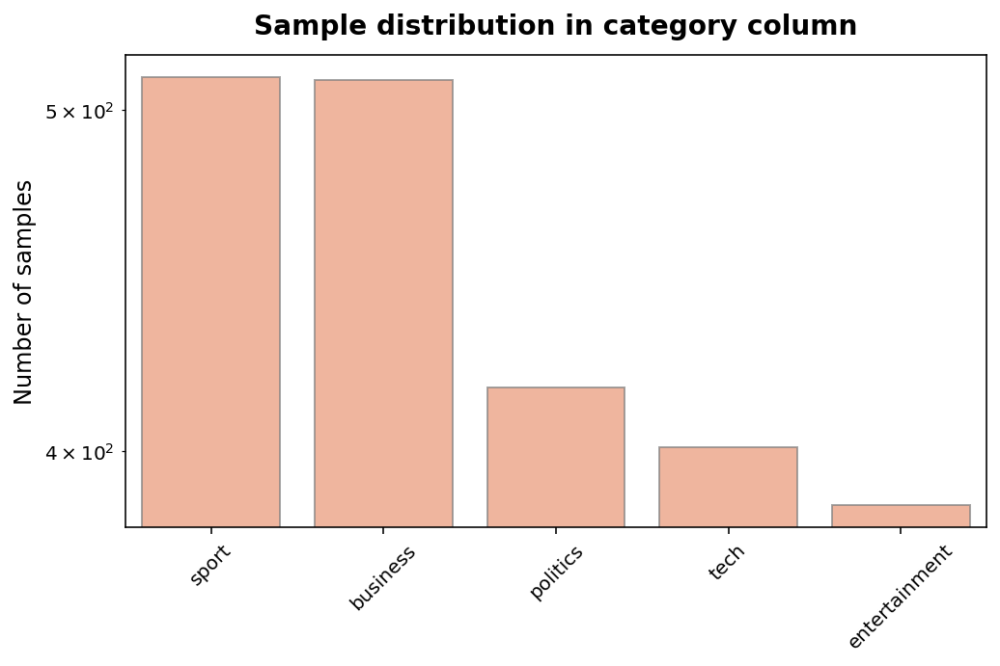

In [7]:
sample_distribution(df['category'])

### How many words per document are there?

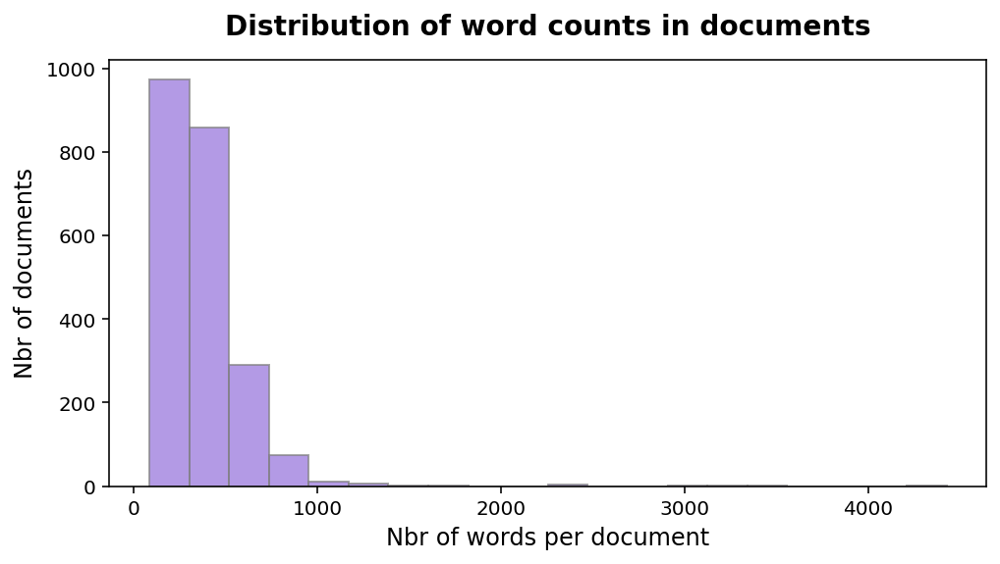

In [8]:
# Plot the word distibution in documents
    
# Barplot and font specifications
barplot_specs = {"color": "mediumpurple", "alpha": 0.7, "edgecolor": "grey"}
label_specs   = {"fontsize": 12}
title_specs   = {"fontsize": 14, "fontweight": "bold", "y": 1.03}

plt.figure(figsize=(8,4))

plt.hist(df['text'].apply(lambda x: len(x.split())), bins = 20, **barplot_specs)

plt.xlabel('Nbr of words per document', **label_specs)
plt.ylabel('Nbr of documents',**label_specs)
plt.title('Distribution of word counts in documents',**title_specs)
plt.show()

In [9]:
# Summary statistics for words in documents

pd.Series(df['text'].apply(lambda x: len(x.split()))).describe(percentiles=[0.50,0.75,0.80,0.90]).T

count    2225.000000
mean      378.835955
std       238.220755
min        84.000000
50%       326.000000
75%       466.000000
80%       499.000000
90%       611.000000
max      4428.000000
Name: text, dtype: float64

* The number of words in the documents ranges between 84 (shortest document) and 4428.000000 (longest document).
* 90% of the documents in the data have 611 words (or less) (90-percentile).

## 3. Feature extraction from text data

There are several different approaches for extracting features from text. I will use the universal-sentence-encoder module from [TensorFlow-Hub](https://tfhub.dev/google/universal-sentence-encoder/4) as it is well suited for performing similarity tasks.

In [10]:
import tensorflow_hub as hub

embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

2022-04-11 01:34:07.970792: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-04-11 01:34:09.944584: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


In [11]:
%%time
embeddings = embed(df['text'])

print(embeddings.shape)
# Wall time: 7.4 s

(2225, 512)
CPU times: user 8.81 s, sys: 2.53 s, total: 11.3 s
Wall time: 6.85 s


### Visualize the intensity of text embeddings per cateogy

Similar samples of text will have similar sentence embeddings. Below, I'm plotting the sentence embeddings of documents belonging to the same category.

In [12]:
X_embed = embeddings.numpy()
X_embed.shape

(2225, 512)

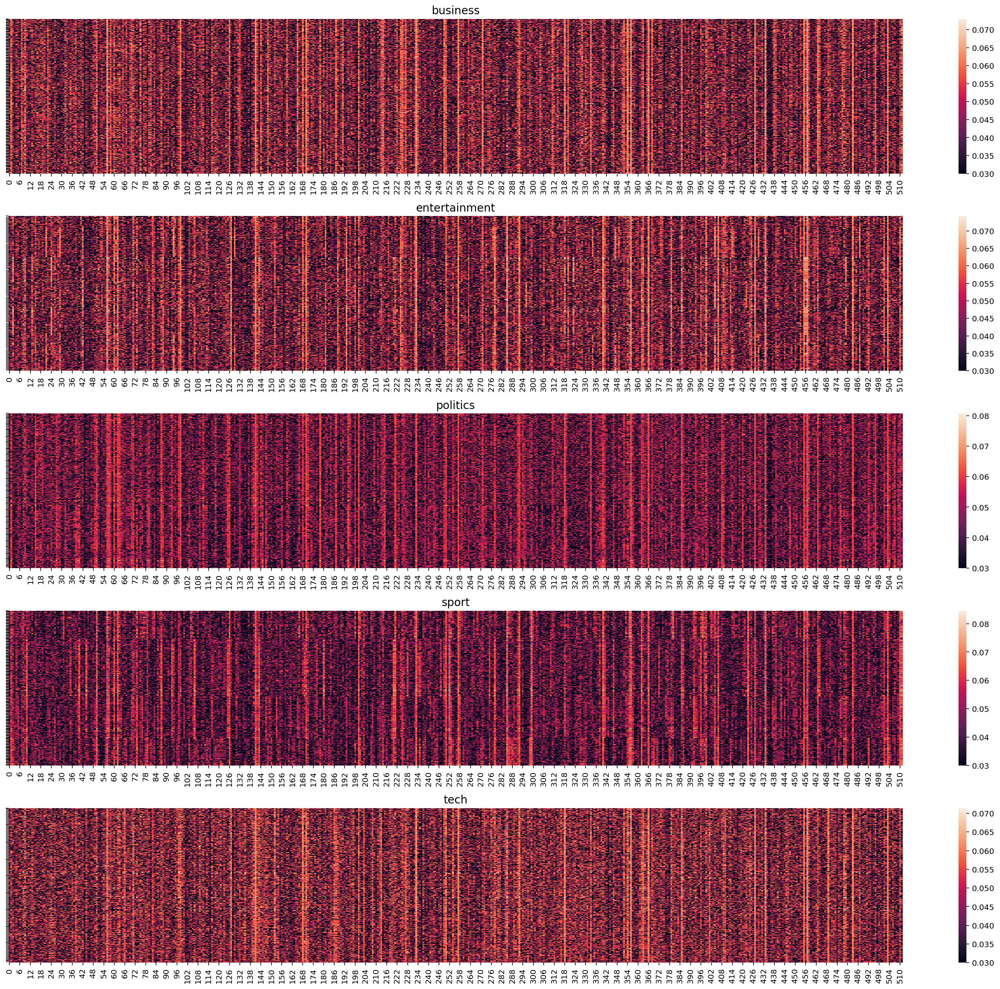

In [13]:
# Create list of selected topics
selected_topics = ['business', 'entertainment', 'politics', 'sport', 'tech']

# Plot embeddings by topic
fig,axes = plt.subplots(len(selected_topics),1,figsize=(20,3.5*len(selected_topics)))

for topic, ax in zip(selected_topics,axes.ravel()):
    
    # Get embeddings corresponding to a specific topic
    idx = df['category'] == topic
    X_plot = X_embed[idx]

    sns.heatmap(np.abs(X_plot),
                vmin=0.03,
                ax=ax)
    ax.set_title(topic,{'fontsize':14})
    ax.set_yticks(ticks = np.arange(0,len(X_plot),3))
    
plt.tight_layout();

### T-SNE biplots
Let's plot the various vector representations of text that we created previously. Then we can look for "patterns", such as clusters of documents. However, we can only plot data in 2 or 3 dimensions, not more. This means that we need to perform "dimensionality reduction", which consists of "compressing" the data into a few 2 (or 3) dimensions without losing too much information.

Two popular "dimensionality reduction" techniques are:

* Principal component analysis
* T-SNE

In [14]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.pipeline import make_pipeline

decomp = make_pipeline(PCA(n_components=40), TSNE(n_components=2, learning_rate='auto'))

# Embeddings
X_decomp_embed = decomp.fit_transform(X_embed)
print('Embeddings after PCA:\t\t',X_decomp_embed.shape)

/Users/xydi/opt/miniconda3/envs/adsml/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


Embeddings after PCA:		 (2225, 2)


/Users/xydi/opt/miniconda3/envs/adsml/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


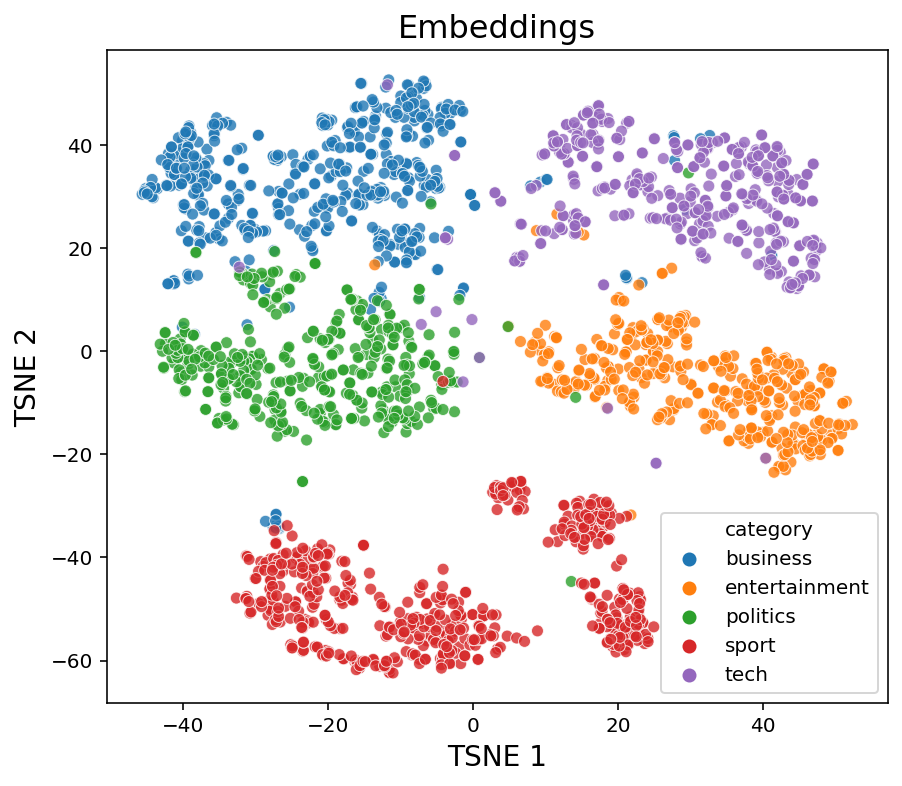

In [15]:
# Plot results

title_specs = {'fontsize':16}
label_specs = {'fontsize':14}
ticks_specs = {'fontsize':13}

fig,axes = plt.subplots(1,1,figsize=(7,6))

#Plot X_decomp_embed
sns.scatterplot(X_decomp_embed[:,0],X_decomp_embed[:,1],alpha=0.8, 
                hue = df['category'],ax=axes)
axes.set_xlabel('TSNE 1',label_specs)
axes.set_ylabel('TSNE 2',label_specs);
axes.set_title('Embeddings',title_specs);

## 4. Text similarity

The cosine similarity is commonly used to measure document similarity, as it isn't affected by the vectors' length or Euclidean distance’s problem with high dimensionality.

The cosine similarity is the cosine of the angle between two vectors.

In [16]:
# Import cosine_similarity

from sklearn.metrics.pairwise import cosine_similarity

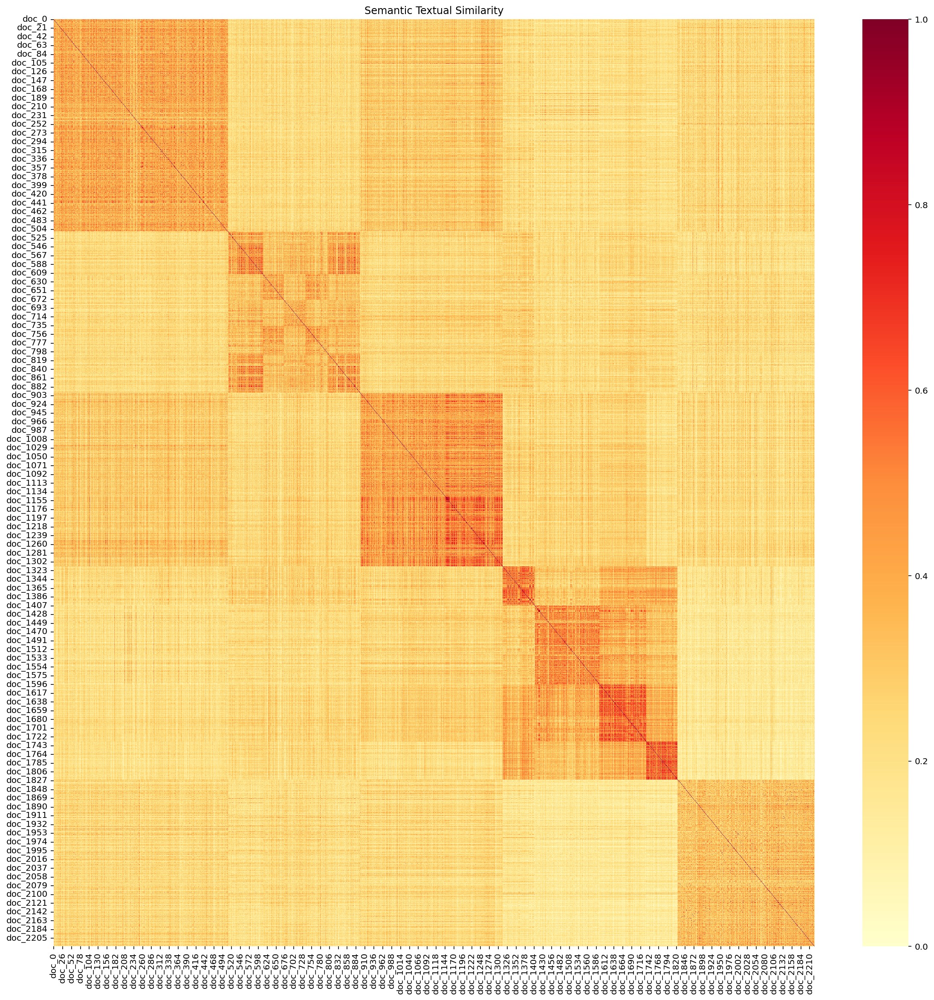

In [17]:
# Write your solution here

# Select features
X = X_embed

# Compute tweet similarity
similarity_df = pd.DataFrame(cosine_similarity(X))

similarity_df.index   = ['doc_'+str(i) for i in range(0,len(X))]
similarity_df.columns = ['doc_'+str(i) for i in range(0,len(X))]
similarity_df.head()

# Plot your results
plot_similarity(similarity_df)

## 5. News recommender

In [18]:
import random

# Generate random sample_text
idx = random.randint(0,len(df))

sample_text = df.iloc[idx,3]
title = df.iloc[idx,2]
category = df.iloc[idx,1]

print("Sample text")
print('-----------')
print('Title: ',title)
print('Category: ',category)
print('\nText:\n',sample_text)

Sample text
-----------
Title:  Ferguson fears Milan cutting edge
Category:  sport

Text:
 Manchester United manager Sir Alex Ferguson said his side's task against AC Milan would not be made any easier by the absence of Andriy Shevchenko.  Milan's talismanic European footballer of the year misses Wednesday's Champions League first-leg tie after fracturing his cheekbone. "It's a loss (to Milan), but it could be worse if they didn't have such quality to bring in," Ferguson said. "How much they miss him I think they'll know tomorrow night." Ferguson said Milan's front line would still represent a formidable challenge for his defenders. "They can play Rui Costa and play Kaka forward. They can bring Serginho in and they can play (Jon Dahl) Tomasson," he said. Ferguson's own goalscoring talisman Ruud van Nistelrooy is fit again, but the Scot admitted he was unsure whether to start the Dutchman, who has not played for three months.  "Ruud is the best striker in Europe. What I have to judge is

In [19]:
# Show similar documents

pd.DataFrame(recommender(sample_text, categories='none', k=10))

,id,category,title,similarity_score
0,1465,sport,Ferguson fears Milan cutting edge,1.000000
1,1409,sport,Van Nistelrooy set to return,0.752393
2,1595,sport,Ferguson hails Man Utd's resolve,0.727055
3,1551,sport,Ferguson puts faith in youngsters,0.709395
4,1552,sport,Beckham relief as Real go through,0.695729
5,1415,sport,Gerrard plays down European hopes,0.672177
6,1471,sport,Stam spices up Man Utd encounter,0.671042
7,1531,sport,Mourinho plots impressive course,0.669054
8,1542,sport,McClaren targets Champions League,0.667384
9,1494,sport,Desailly backs Blues revenge trip,0.665473


In [20]:
# Show similar documents

pd.DataFrame(recommender(sample_text, categories='business,tech', k=15))

,id,category,title,similarity_score
0,209,business,Mixed reaction to Man Utd offer,0.482090
1,242,business,Q&A: Malcolm Glazer and Man Utd,0.421355
2,193,business,Borussia Dortmund near bust,0.415004
3,229,business,Shares rise on new Man Utd offer,0.398578
4,293,business,Glazer makes new Man Utd approach,0.386764
5,179,business,Irish duo could block Man Utd bid,0.384819
6,219,business,Rescue hope for Borussia Dortmund,0.353807
7,52,business,Italy to get economic action plan,0.349171
8,224,business,Man Utd to open books to Glazer,0.346311
9,271,business,Arsenal 'may seek full share listing',0.343901


## Data export

Below, I will export the (cleaned) BBC news articles and the text embeddings, for faster loading in the REST api.

In [21]:
# Export clean documents

#df.drop('text',axis=1).to_csv('data/clean_documents.csv',index=False)

In [22]:
# Export embeddings

#np.savez('data/embeddings.npz',embeddings = embeddings)